Diese Notebook enthält die Probe von alle Sub boxes zusammen und main boxes zusammen. Die Probe wurde dann auf die subboxes visualisiert, aber hat nicht geklappt. Das Training war am Besten nur, wenn der Datensatz in 4 Teile unterteilt wurde. Diese sieht man in Sub_Box_training.ipnb. das Vorgehen ist etwa unterschiedlich da.

importing the required packages and libraries.

In [1]:
import os
import xml.etree.ElementTree as ET
import tensorflow as tf
import keras_cv

from tqdm.auto import tqdm
from tensorflow import keras
from keras_cv import bounding_box
from keras_cv import visualization
from tensorflow.keras.models import load_model
import numpy as np
from tensorflow.keras.models import Sequential, model_from_json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
from keras.callbacks import EarlyStopping
from tensorflow.keras import layers
from sklearn.preprocessing import OneHotEncoder



Using TensorFlow backend


Globale Variable

In [2]:
WORKSPACE_PATH = 'workspace'
LARGE_DATASET_ANNOTAIONS = '../data_zettel/Annotations'
ANNOTATION_PATH = WORKSPACE_PATH+'/annotations'
ORIGINAL_ANNOTATION_PATH = LARGE_DATASET_ANNOTAIONS #ANNOTATION_PATH+'/original'
IMAGE_PATH = WORKSPACE_PATH+'/images'
LARGE_DATASET_IMAGES = '../data_zettel/filled_resized'
ORIGINAL_IMAGE_PATH = LARGE_DATASET_IMAGES#IMAGE_PATH+'/original'
MODEL_PATH = WORKSPACE_PATH+'/models'
TEST_IMAGE_PATH = IMAGE_PATH +'/Bilder'
IMAGE_PATH_scaled = IMAGE_PATH + '/640x640_main_classes_scaled'
SPLIT_RATIO = 0.2
BATCH_SIZE = 2
LEARNING_RATE = 0.0001
EPOCH = 50
GLOBAL_CLIPNORM = 10.0
NEW_HEIGHT = 640
NEW_WIDTH = 640  

The Dataset Preparation

In [3]:
class_ids = [
"Ausbildung_Staette" ,
"Ausbildung_Klasse" ,
"Ausbilung_Abschluss" ,
"Ausbildung_Vollzeit" ,
"Ausbildung_Antrag_gestellt_ja" ,
"Ausbildung_Amt" ,
"Ausbildung_Foerderungsnummer" ,
"Person_Name",
"Person_Vorname" ,
"Person_Geburtsname" ,
"Person_Geburtsort" ,
"Person_Geburtsdatum" ,
"Person_Familienstand" ,
"Person_Familienstand_seit",
"Person_Stattsangehörigkeit_eigene" ,
"Person_Stattsangehörigkeit_Ehegatte" ,
"Person_Kinder",
"Wohnsitz_Strasse",
"Wohnsitz_Hausnummer",
"Wohnsitz_Adresszusatz",
"Wohnsitz_Land",
"Wohnsitz_Postleitzahl",
"Wohnsitz_Ort",
"Wohnsitz_waehrend_Ausbildung_Strasse",
"Wohnsitz_waehrend_Ausbildung_Hausnummer",
"Wohnsitz_waehrend_Ausbildung_Adresszusatz",
"Wohnsitz_waehrend_Ausbildung_Land",
"Wohnsitz_waehrend_Ausbildung_Postleitzahl",
"Wohnsitz_waehrend_Ausbildung_Ort",
"Ausbildung",
"Person" ,
"Wohnsitz",
"Wohnsitz_waehrend_Ausbildung" ,
]
sub_class_ids = [
#7
"Ausbildung_Staette" ,
"Ausbildung_Klasse" ,
"Ausbilung_Abschluss" ,
"Ausbildung_Vollzeit" ,
"Ausbildung_Antrag_gestellt_ja" ,
"Ausbildung_Amt" ,
"Ausbildung_Foerderungsnummer" ,
#10
"Person_Name",
"Person_Vorname" ,
"Person_Geburtsname" ,
"Person_Geburtsort" ,
"Person_Geburtsdatum" ,
"Person_Familienstand" ,
"Person_Familienstand_seit",
"Person_Stattsangehörigkeit_eigene" ,
"Person_Stattsangehörigkeit_Ehegatte" ,
"Person_Kinder",
#6
"Wohnsitz_Strasse",
"Wohnsitz_Hausnummer",
"Wohnsitz_Adresszusatz",
"Wohnsitz_Land",
"Wohnsitz_Postleitzahl",
"Wohnsitz_Ort",
#6
"Wohnsitz_waehrend_Ausbildung_Strasse",
"Wohnsitz_waehrend_Ausbildung_Hausnummer",
"Wohnsitz_waehrend_Ausbildung_Adresszusatz",
"Wohnsitz_waehrend_Ausbildung_Land",
"Wohnsitz_waehrend_Ausbildung_Postleitzahl",
"Wohnsitz_waehrend_Ausbildung_Ort",
]
main_class_ids=[
"Ausbildung",
"Person" ,
"Wohnsitz",
"Wohnsitz_waehrend_Ausbildung" ,
]
num_ausbildungs_ids = 7
num_personen_ids = 10
num_wohnsitz_ids = 6
num_wohnsitz_waehrend_ausbildung_ids = 6

class_mapping = dict(zip(range(len(class_ids)), class_ids))
main_class_mapping = dict(zip(range(len(main_class_ids)), main_class_ids))
sub_class_mapping = dict(zip(range(len(sub_class_ids)), sub_class_ids))
print(sub_class_mapping)

{0: 'Ausbildung_Staette', 1: 'Ausbildung_Klasse', 2: 'Ausbilung_Abschluss', 3: 'Ausbildung_Vollzeit', 4: 'Ausbildung_Antrag_gestellt_ja', 5: 'Ausbildung_Amt', 6: 'Ausbildung_Foerderungsnummer', 7: 'Person_Name', 8: 'Person_Vorname', 9: 'Person_Geburtsname', 10: 'Person_Geburtsort', 11: 'Person_Geburtsdatum', 12: 'Person_Familienstand', 13: 'Person_Familienstand_seit', 14: 'Person_Stattsangehörigkeit_eigene', 15: 'Person_Stattsangehörigkeit_Ehegatte', 16: 'Person_Kinder', 17: 'Wohnsitz_Strasse', 18: 'Wohnsitz_Hausnummer', 19: 'Wohnsitz_Adresszusatz', 20: 'Wohnsitz_Land', 21: 'Wohnsitz_Postleitzahl', 22: 'Wohnsitz_Ort', 23: 'Wohnsitz_waehrend_Ausbildung_Strasse', 24: 'Wohnsitz_waehrend_Ausbildung_Hausnummer', 25: 'Wohnsitz_waehrend_Ausbildung_Adresszusatz', 26: 'Wohnsitz_waehrend_Ausbildung_Land', 27: 'Wohnsitz_waehrend_Ausbildung_Postleitzahl', 28: 'Wohnsitz_waehrend_Ausbildung_Ort'}


In [4]:
# Get all XML file paths in path_annot and sort them
xml_files = sorted(
    [
        os.path.join(ORIGINAL_ANNOTATION_PATH, file_name)
        for file_name in os.listdir(ORIGINAL_ANNOTATION_PATH)
        if file_name.endswith(".xml")
    ]
)
 
# Get all JPEG image file paths in path_images and sort them
jpg_files = sorted(
    [
        os.path.join(ORIGINAL_IMAGE_PATH, file_name)
        for file_name in os.listdir(ORIGINAL_IMAGE_PATH)
        if file_name.endswith(".jpg")
    ]
)

parsing the XML annotation files

In [5]:
def map_class_id(classes, cls):    
    class_ids = [
        list(class_mapping.keys())[list(class_mapping.values()).index(cls)]
        for cls in classes
    ]
    return class_ids

def create_box(bbox):
    xmin = float(bbox.find("xmin").text)
    ymin = float(bbox.find("ymin").text)
    xmax = float(bbox.find("xmax").text)
    ymax = float(bbox.find("ymax").text)
    return [xmin, ymin, xmax, ymax]

In [6]:
def parse_annotation(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
 
    image_name = root.find("filename").text
    image_path = os.path.join(ORIGINAL_IMAGE_PATH, image_name)
    
    boxes = []
    classes = []
    main_classes = []
    sub_classes = []
    main_boxes = []
    sub_boxes = []
    for obj in root.iter("object"):
        cls = obj.find("name").text
        classes.append(cls)
 
        bbox = obj.find("bndbox")
        boxes.append( create_box(bbox))
        #main labels
        if (cls=='Wohnsitz_waehrend_Ausbildung')or(cls=='Ausbildung') or (cls =='Person') or (cls == 'Wohnsitz'):
            main_classes.append(cls)
            bbox = obj.find("bndbox")
            main_boxes.append( create_box(bbox))
        else:
            bbox = obj.find("bndbox")
            sub_boxes.append( create_box(bbox))
            sub_classes.append(cls)
    class_ids = map_class_id(classes, cls)
    main_class_ids = map_class_id(main_classes, cls)            
    sub_class_ids = map_class_id(sub_classes, cls)
   
    return image_path, boxes, class_ids, main_class_ids, sub_class_ids, main_boxes, sub_boxes, image_name
 

In [7]:
image_paths = []
image_names = []
bbox = []
classes = []
main_classes = []
sub_classes= []
main_bbox= []
sub_bbox= []
for xml_file in tqdm(xml_files):
    image_path, boxes, class_ids, main_class_ids,sub_class_ids, main_boxes, sub_boxes, image_name = parse_annotation(xml_file)
    image_paths.append(image_path)
    bbox.append(boxes)
    classes.append(class_ids)
    image_names.append(image_name)

    main_classes.append(main_class_ids)
    sub_classes.append(sub_class_ids)
    main_bbox.append(main_boxes)
    sub_bbox.append(sub_boxes)

subset_image_paths_all=image_paths
subset_boxes_all=sub_bbox

  0%|          | 0/81 [00:00<?, ?it/s]

In [10]:
#Sortieren der Klassen gemäß des Antrags von links nach rechts und von oben nach unten
#Gleichermaßen werden die boxen sortiert
def sort_rem_pos(sub_classes, sub_bbox):
    #Verketten von Pos und Wert
    enumerated_liste = list(enumerate(sub_classes))
    sorted_enumerated_liste = sorted(enumerated_liste, key=lambda x: x[1])

    sorted_classes = [item[1] for item in sorted_enumerated_liste]
    old_positions = [item[0] for item in sorted_enumerated_liste]

    sorted_sub_bbox = [sub_bbox[pos] for pos in old_positions]
    return sorted_classes, sorted_sub_bbox
        


In [11]:
sorted_classes = []
sorted_boxes = []

for i in range(len(sub_classes)):
    classes, boxes = sort_rem_pos(sub_classes[i], sub_bbox[i])
    sorted_classes.append(classes)
    sorted_boxes.append(boxes)

sub_classes = sorted_classes 
sub_bbox = sorted_boxes 
subset_class_ids_all=sub_classes

#print('sub classes ',sub_classes)
#print('subset_class_ids_all',subset_class_ids_all)

In [12]:
#Bilder richtig drehen, Boxen und Bilder an x Achse spiegeln
#Bilder die zu drehen sind: 36,37


def rotate(input_path):
    image = cv2.imread(input_path)
    rotated_image = cv2.rotate(image, cv2.ROTATE_180)
    cv2.imwrite(input_path, rotated_image)

def rotate_box(input_path, bounding_boxes):
    image = cv2.imread(input_path)
    rotated_boxes = []
    for bounding_box in bounding_boxes:
        rotated_box = (image.shape[1] - bounding_box[2],
                        image.shape[0] - bounding_box[3],
                        image.shape[1] - bounding_box[0],
                        image.shape[0] - bounding_box[1])
        rotated_boxes.append(rotated_box)
    return rotated_boxes

objects_to_rotate = [35,36]
for i in objects_to_rotate:
    main_bbox[i] = rotate_box('../data_zettel/filled_resized\image_00'+str(i)+'.jpg', main_bbox[i])

In [13]:
def resize_imgaes(input_path, output_path, height, width):
    image =  cv2.imread(input_path)
    resized_image = cv2.resize(image, (width, height))
    cv2.imwrite(output_path, resized_image)    
    
def scale_bounding_boxes(input_path,bounding_boxes, height, width):
    image =  cv2.imread(input_path)

    height_ratio = height / image.shape[0]
    width_ratio = width / image.shape[1]
    x_min = (bounding_boxes[0]*width_ratio)
    y_min = (bounding_boxes[1]*height_ratio)
    x_max = (bounding_boxes[2]*width_ratio)
    y_max = (bounding_boxes[3]*height_ratio)
    return [x_min,y_min,x_max,y_max]


In [14]:
#Create Images from main_classes
IMAGES_MAIN_CLASSES_PATH = IMAGE_PATH +'/640x640_main_classes'

def create_main_images(input_path, output_path, box):
    startY, endY, startX, endX = int(np.round(box[1])), int(np.round(box[3])), int(np.round(box[0])), int(np.round(box[2]))
    image =  cv2.imread(input_path)
    cropped_image = image[startY:endY, startX:endX]
    cv2.imwrite(output_path, cropped_image)  

box_ratio_factors = []
sub_box_calculated = []
main_images_paths = []
main_image_names = []

def calculate_box_ratio_factor(image_path,box):
    image = cv2.imread(image_path)
    box[2], box[2], box[2], box[2]
    relative_xbl = box[0] #/ width
    relative_ybl = box[1] #/ height
    relative_xtr = box[2] #/ width
    relative_ytr = box[3] #/ height
    return [relative_xbl,relative_ybl,relative_xtr,relative_ytr]

def array_calculation(sub_box, main_box):
    return [sub_box[0]-main_box[0],sub_box[1]-main_box[1],sub_box[2]-main_box[0],sub_box[3]-main_box[1]]

#Bilder ausschneiden und speichern
for i in range(len(main_class_ids)):
    for j in range(len(image_paths)):
        box_ratio_factors.append(calculate_box_ratio_factor(image_paths[j], main_bbox[j][i]))
        create_main_images(image_paths[j],IMAGES_MAIN_CLASSES_PATH+'/'+str(i)+'_'+str(j)+'.jpg', main_bbox[j][i])
        main_images_paths.append(IMAGES_MAIN_CLASSES_PATH+'/'+str(i)+'_'+str(j)+'.jpg')
        main_image_names.append(str(i)+'_'+str(j)+'.jpg')

#Resize Images auf 640x640
subsset_scaled_image_paths = []
for img in range(len(main_images_paths)):
    resize_imgaes(main_images_paths[img], IMAGE_PATH+ '/640x640_main_classes_scaled/' +main_image_names[img], 640, 640)
    subsset_scaled_image_paths.append(IMAGE_PATH+ '/640x640_main_classes_scaled/' +main_image_names[img])
#print(subsset_scaled_image_paths)

#Anpassen der Bounding Box Koordinaten zu dem jeweiligen Bildausschnitt
for i in range(len(main_class_ids)):
    for j in range(len(image_paths)):
        for k in range(len(sub_class_ids)):
            sub_box_calculated.append(array_calculation(sub_bbox[j][k], main_bbox[j][i]))



sub_boxes_main_class_1=[]  
sub_boxes_main_class_2=[] 
sub_boxes_main_class_3=[] 
sub_boxes_main_class_4=[] 
sub_boxes_all_main_classes=[]

scaled_sub_boxes_main_class_1=[]  
scaled_sub_boxes_main_class_2=[] 
scaled_sub_boxes_main_class_3=[] 
scaled_sub_boxes_main_class_4=[] 

#Boxen im Verhältnis der main_box zu 640x640 scalen
for i in range(len(image_names)): #81 Bilder
    for j in range(len(sub_class_ids)): #29 Klassen
        arr=[]
        if j < num_ausbildungs_ids: #Ausbildung
            sub_boxes_main_class_1.append(array_calculation(sub_bbox[i][j], main_bbox[i][0]))
            scaled_sub_boxes_main_class_1.append(scale_bounding_boxes(main_images_paths[i],sub_boxes_main_class_1[i],640,640))

        elif (j >= num_ausbildungs_ids) and (j < num_ausbildungs_ids + num_personen_ids) :#Person
            sub_boxes_main_class_2.append(array_calculation(sub_bbox[i][j], main_bbox[i][1]))
            scaled_sub_boxes_main_class_2.append(scale_bounding_boxes(main_images_paths[i+81],sub_boxes_main_class_2[i],640,640))
        elif (j >= num_ausbildungs_ids + num_personen_ids) and (j < num_ausbildungs_ids + num_personen_ids + num_wohnsitz_ids) :#Wohnsitz
            #sub_boxes_main_class_3.append(sub_bbox[i][j])
            sub_boxes_main_class_3.append(array_calculation(sub_bbox[i][j], main_bbox[i][2]))
            scaled_sub_boxes_main_class_3.append(scale_bounding_boxes(main_images_paths[i+162],sub_boxes_main_class_3[i],640,640))
        elif (j >=  num_ausbildungs_ids + num_personen_ids + num_wohnsitz_ids) and (j < num_ausbildungs_ids + num_personen_ids + num_wohnsitz_ids + num_wohnsitz_waehrend_ausbildung_ids) :#Wohnsitz_während_Ausildung
            sub_boxes_main_class_4.append(array_calculation(sub_bbox[i][j], main_bbox[i][3]))
            scaled_sub_boxes_main_class_4.append(scale_bounding_boxes(main_images_paths[i+243],sub_boxes_main_class_4[i],640,640))

In [15]:
def show_image(image, boxes):
    image = cv2.imread(image)

    fig, ax = plt.subplots(1)
    ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 

    # Bounding Boxes zeichnen
    for box in boxes:
        xmin, ymin, xmax, ymax = map(int, box)
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)

    plt.show()

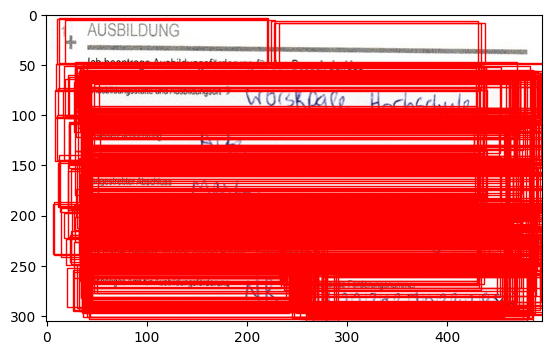

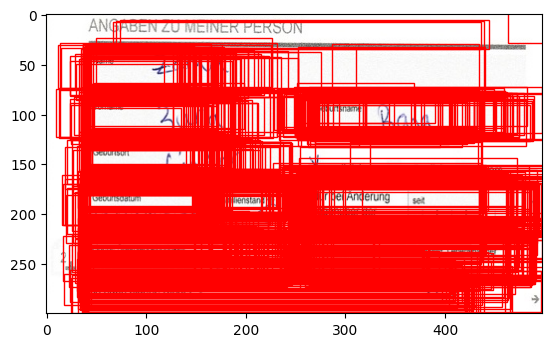

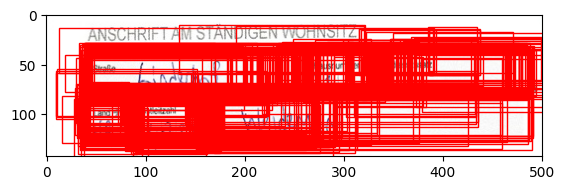

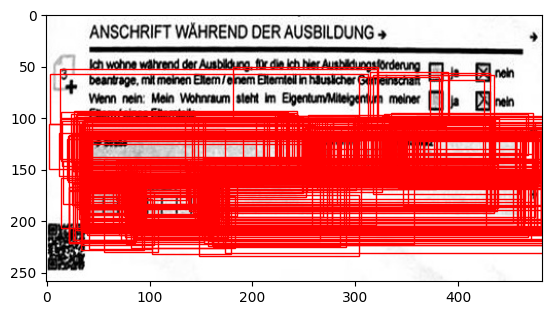

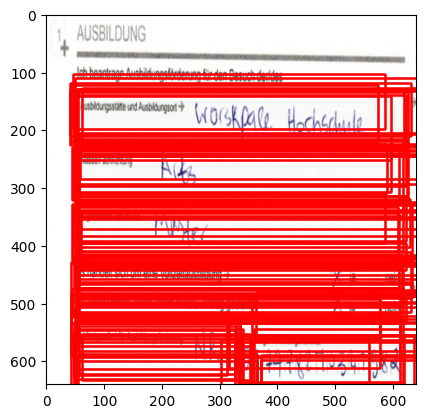

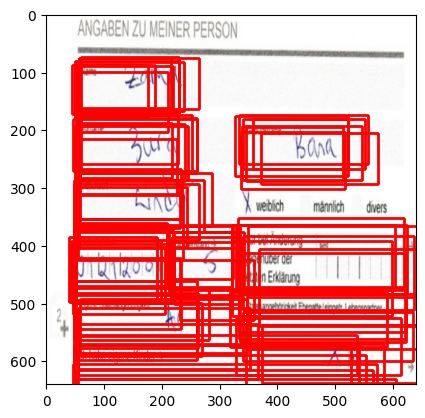

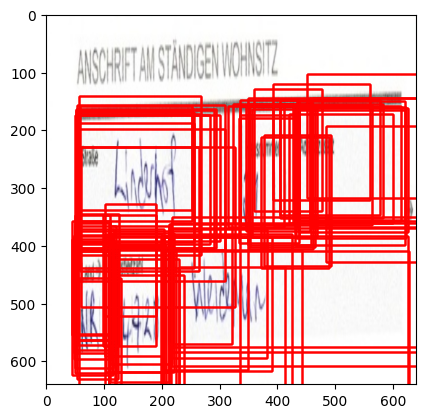

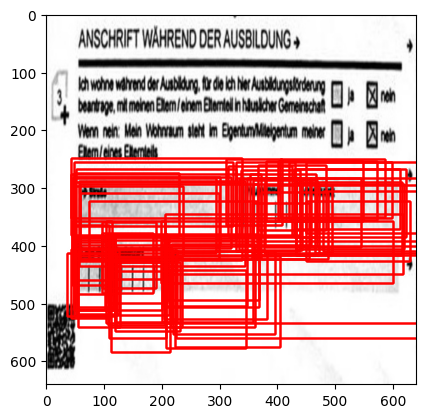

In [16]:
show_image(main_images_paths[0],sub_boxes_main_class_1)
show_image(main_images_paths[82],sub_boxes_main_class_2)
show_image(main_images_paths[170],sub_boxes_main_class_3)
show_image(main_images_paths[255],sub_boxes_main_class_4)

show_image(subsset_scaled_image_paths[0],scaled_sub_boxes_main_class_1)
show_image(subsset_scaled_image_paths[82],scaled_sub_boxes_main_class_2)
show_image(subsset_scaled_image_paths[170],scaled_sub_boxes_main_class_3)
show_image(subsset_scaled_image_paths[255],scaled_sub_boxes_main_class_4)

In [17]:
#create 4 datasets
#image_paths
#shape(81,x)
subset_images_paths_1 = []
subset_images_paths_2 = []
subset_images_paths_3 = []
subset_images_paths_4 = []
for i in range(len(subsset_scaled_image_paths)):
        if i < len(image_names): #Ausbildung
            subset_images_paths_1.append(subsset_scaled_image_paths[i])
        elif (i >= len(image_names)) and (i < (len(image_names)*2)) :#Person
            subset_images_paths_2.append(subsset_scaled_image_paths[i])
        elif (i >= (len(image_names)*2)) and (i < (len(image_names)*3)) :#Wohnsitz
            subset_images_paths_3.append(subsset_scaled_image_paths[i])
        elif (i >= (len(image_names)*3)) and (i < (len(image_names)*4)) :#Wohnsitz_während_Ausildung
            subset_images_paths_4.append(subsset_scaled_image_paths[i])
#classes
subset_class_ids_1_1 = []
subset_class_ids_2_2 = []
subset_class_ids_3_3 = []
subset_class_ids_4_4 = []
subset_class_ids_1 = []
subset_class_ids_2 = []
subset_class_ids_3 = []
subset_class_ids_4 = []
classes=[]
#shape(81,x)
for i in range(len(subset_class_ids_all[0])):
        if i < num_ausbildungs_ids: #Ausbildung
                subset_class_ids_1_1.append(subset_class_ids_all[0][i])
        elif (i >= num_ausbildungs_ids) and (i < num_ausbildungs_ids + num_personen_ids) :#Person
                subset_class_ids_2_2.append(subset_class_ids_all[0][i])
        elif (i >= num_ausbildungs_ids + num_personen_ids) and (i < num_ausbildungs_ids + num_personen_ids + num_wohnsitz_ids) :#Wohnsitz
                subset_class_ids_3_3.append(subset_class_ids_all[0][i])
        elif (i >= num_ausbildungs_ids + num_personen_ids + num_wohnsitz_ids) and (i < num_ausbildungs_ids + num_personen_ids + num_wohnsitz_ids + num_wohnsitz_waehrend_ausbildung_ids) :#Wohnsitz_während_Ausildung
                subset_class_ids_4_4.append(subset_class_ids_all[0][i])

for i in range (0,len(image_names)):
    subset_class_ids_1.append(subset_class_ids_1_1)
    subset_class_ids_2.append(subset_class_ids_2_2)
    subset_class_ids_3.append(subset_class_ids_3_3)
    subset_class_ids_4.append(subset_class_ids_4_4)

#boxen
subset_boxes_1 = []
subset_boxes_2 = []
subset_boxes_3 = []
subset_boxes_4 = []
#shape(18,x,4)
def shape_to_3_tupel(num_images, num_classes, scaled_boxes):
    subset_boxes = []
    arr= np.array(scaled_boxes)
    arr_1=arr.reshape(num_images,num_classes,4)
    for j in range(0,num_images):
        arr_1_1=[]
        for i in range(0,num_classes):
            arr_1_1.append(arr_1[i][0])
        subset_boxes.append(arr_1_1)
    return subset_boxes


subset_boxes_1 = shape_to_3_tupel(len(image_names), num_ausbildungs_ids, scaled_sub_boxes_main_class_1)
subset_boxes_2 = shape_to_3_tupel(len(image_names), num_personen_ids, scaled_sub_boxes_main_class_2)
subset_boxes_3 = shape_to_3_tupel(len(image_names), num_wohnsitz_ids, scaled_sub_boxes_main_class_3)
subset_boxes_4 = shape_to_3_tupel(len(image_names), num_wohnsitz_waehrend_ausbildung_ids, scaled_sub_boxes_main_class_4)


In [18]:
main_class_ids = []
for i in range(len(subset_image_paths_all)):
    main_class_ids.append([0,1,2,3])



In [19]:
#Entfernen fehlerhafter Annotationen aus Datensatz
#main
indexes_of_false_annotations_main = [31,31,31]
main_image_names = []


for img in subset_image_paths_all:
    main_image_names.append(img)

for index in indexes_of_false_annotations_main:
    main_bbox.pop(index)
    main_image_names.pop(index)
    main_class_ids.pop(index)

#sub 
indexes_of_false_annotations_sub = [31,31,31]


def pop_annotaions(classes, images, boxes, indexes):
    for index in indexes:
        boxes.pop(index)
        images.pop(index)
        classes.pop(index)

pop_annotaions(subset_class_ids_1, subset_images_paths_1, subset_boxes_1, indexes_of_false_annotations_sub)
pop_annotaions(subset_class_ids_2, subset_images_paths_2, subset_boxes_2, indexes_of_false_annotations_sub)
pop_annotaions(subset_class_ids_3, subset_images_paths_3, subset_boxes_3, indexes_of_false_annotations_sub)
pop_annotaions(subset_class_ids_4, subset_images_paths_4, subset_boxes_4, indexes_of_false_annotations_sub)

#pop_annotaions(subset_class_ids_4, subset_images_paths_4, subset_boxes_4, indexes_of_false_annotations_sub)
print(len(subset_images_paths_1))

78


In [34]:
classes=[]
images=[]
box=[]
#shape (324,) subset aus 4 main_boxen
"""for i in range(len(subset_boxes_1)):
    box.append(subset_boxes_1[i])
    images.append(subset_images_paths_1[i])
    classes.append(subset_class_ids_1[i])
for i in range(len(subset_boxes_2)):
    box.append(subset_boxes_2[i])
    images.append(subset_images_paths_2[i])
    classes.append(subset_class_ids_2[i])
for i in range(len(subset_boxes_3)):
    box.append(subset_boxes_3[i])
    images.append(subset_images_paths_3[i])
    classes.append(subset_class_ids_3[i])
for i in range(len(subset_boxes_4)):
    box.append(subset_boxes_4[i])
    images.append(subset_images_paths_4[i])
    classes.append(subset_class_ids_4[i])"""

#hinzugügen des sets der ganzen Seite
for i in range(len(subset_boxes_all)):
    box.append(subset_boxes_all[i])
    images.append(subset_image_paths_all[i])
    classes.append(subset_class_ids_all[i])

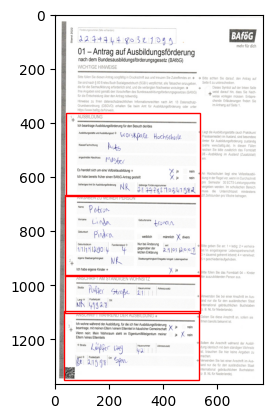

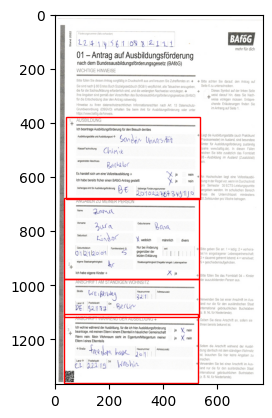

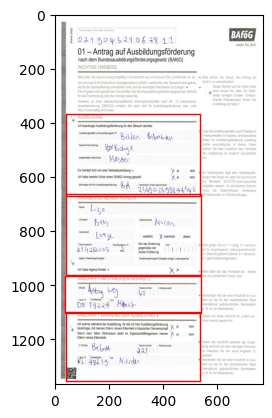

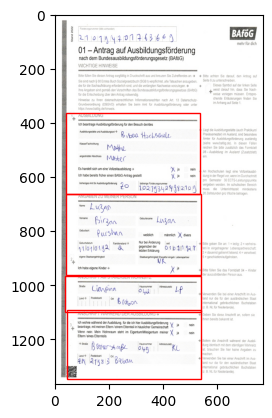

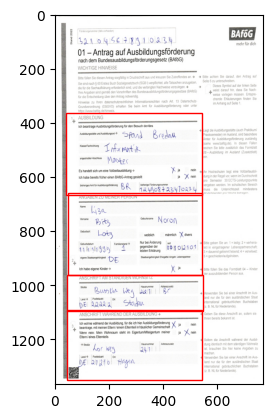

...

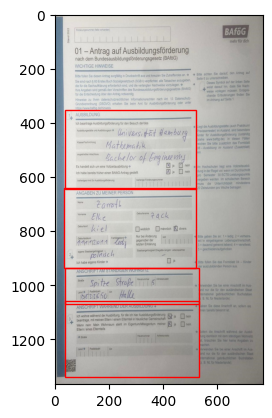

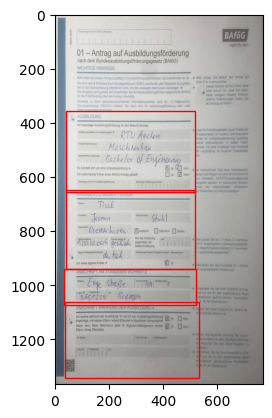

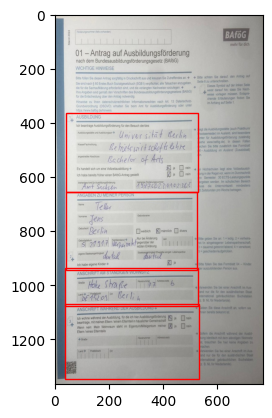

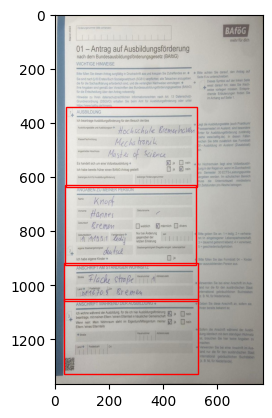

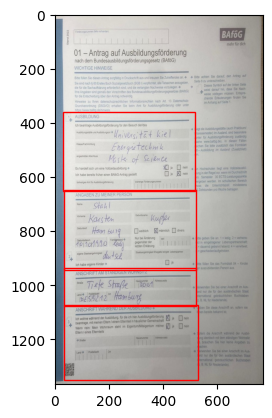

'for i in range(len(images)):\n    print(i)\n    show_image(images[i], box[i])'

In [35]:
#überprüfen der Boxen
for i in range(len(main_image_names)):
    show_image(main_image_names[i], main_bbox[i])

"""for i in range(len(images)):
    print(i)
    show_image(images[i], box[i])"""


In [22]:
def create_data_tensor(image_paths,classes,bbox):
    bbox = tf.ragged.constant(bbox, dtype=tf.float32)
    classes = tf.ragged.constant(classes, dtype=tf.float32)
    image_paths = tf.ragged.constant(image_paths, dtype=tf.string)
    data = tf.data.Dataset.from_tensor_slices((image_paths, classes, bbox))
    return data

Diese Methode hilft zur Umwandlung der Klassenlabels zu einer 3D Struktur, diese ist erforderlich für das SSD_Model training 

In [29]:
def one_hot_encode_2d_to_3d(input_array):
    # Flatten the input array to find unique values
    flattened_input = sum(input_array, [])
    
    # Find the unique values and their indices
    unique_values, indices = np.unique(flattened_input, return_inverse=True)
    
    # Number of classes is the total number of unique values
    num_classes = len(unique_values) 
    print(num_classes)
    # One-hot encode each value in the input array using the indices
    one_hot_encoded = tf.one_hot(indices, depth=num_classes)
    
    # Reshape the one-hot encoded array to match the input array shape
    reshaped_encoded = np.reshape(one_hot_encoded, (len(input_array), len(input_array[0]), num_classes))
    
    # Convert the NumPy array to a list of lists
    reshaped_encoded_list = reshaped_encoded.tolist()
    
    return reshaped_encoded_list

Umwandlung der Labels von 2D zu 3D

In [ ]:

# Perform one-hot encoding
main_class_ids_3d = one_hot_encode_2d_to_3d(main_class_ids)
classes_3d = one_hot_encode_2d_to_3d(classes)


In [25]:
#2D version of main and sub classes 
# new_sub_data_all = create_data_tensor(images,classes, box )
# main_boxes_data = create_data_tensor(main_image_names, main_class_ids, main_bbox )

#3D version of main and sub classes 
new_sub_data_all = create_data_tensor(images,classes_3d, box )
main_boxes_data = create_data_tensor(main_image_names, main_class_ids_3d, main_bbox )

In [26]:
def create_train_test_data(split, data_tensor):
    num_val = int(split * SPLIT_RATIO)#int(len(image_path_list)
    val_data = data_tensor.take(num_val)
    train_data = data_tensor.skip(num_val)
    return val_data, train_data

In [27]:
#Bilder durchmischen
new_sub_data_all = new_sub_data_all.shuffle(len(images), reshuffle_each_iteration=True)
main_boxes_data = main_boxes_data.shuffle(len(main_image_names), reshuffle_each_iteration=True)

In [28]:
sub_val_data_all, sub_train_data_all  = create_train_test_data(len(images) , new_sub_data_all)
main_val_data_all, main_train_data_all  = create_train_test_data(len(main_image_names) , main_boxes_data)

In [29]:
def load_image(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_jpeg(image, channels=3)
    return image
 

def load_dataset(image_path, classes_3d, bbox):
    # Read Image
    image = load_image(image_path)
    bounding_boxes = {
        "classes": classes_3d,
        "boxes": bbox,
    }
    return {"images": tf.cast(image, tf.float32), "bounding_boxes": bounding_boxes}

In [30]:
augmenter = keras.Sequential(
    layers=[
        keras_cv.layers.JitteredResize(
            target_size=(640, 640),
            #target_size=(1344, 768),
            scale_factor=(1, 1),
            bounding_box_format="xyxy",
        )
        ,
    ]
)

In [31]:
def augment_brightness_and_contrast(data_dict):
    # Apply brightness and contrast augmentation
    data_dict["images"] = tf.image.random_brightness(data_dict["images"], max_delta=0.5)
    data_dict["images"] = tf.image.random_contrast(data_dict["images"], lower=0.7, upper=1)
    
    return data_dict

In [32]:
def create_train_ds(train_data):
    train_ds = train_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    train_ds = train_ds.map(augment_brightness_and_contrast, num_parallel_calls=tf.data.AUTOTUNE)
    train_ds = train_ds.shuffle(BATCH_SIZE * 8)
    train_ds = train_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
    #train_ds = train_ds.map(augmenter, num_parallel_calls=tf.data.AUTOTUNE)
      # Resize images to the desired shape (640, 640)
    train_ds = train_ds.map(lambda x: {'images': tf.image.resize(x['images'], (640, 640)), 'bounding_boxes': x['bounding_boxes']})
    
    return train_ds

In [33]:
sub_train_ds_all = create_train_ds(sub_train_data_all)
main_train_ds_all = create_train_ds(main_train_data_all)

In [34]:
resizing = keras_cv.layers.JitteredResize(
    target_size=(640, 640),
    #target_size=(1344, 768),
    scale_factor=(1, 1),
    bounding_box_format="xyxy",
)

def create_val_ds(val_data):
    val_ds = val_data.map(load_dataset, num_parallel_calls=tf.data.AUTOTUNE)
    val_ds = val_ds.shuffle(BATCH_SIZE * 8)
    val_ds = val_ds.ragged_batch(BATCH_SIZE, drop_remainder=True)
    val_ds = val_ds.map(resizing, num_parallel_calls=tf.data.AUTOTUNE)
    return val_ds

In [35]:
sub_val_ds_all= create_train_ds(sub_val_data_all)
main_val_ds_all= create_train_ds(main_val_data_all)

In [126]:
def visualize_dataset(inputs, value_range, rows, cols, bounding_box_format):
    inputs = next(iter(inputs.take(1)))
    images, bounding_boxes = inputs["images"], inputs["bounding_boxes"]
    visualization.plot_bounding_box_gallery(
        images,
        value_range=value_range,
        rows=rows,
        cols=cols,
        y_true=bounding_boxes,
        scale=5,
        font_scale=0.2,
        bounding_box_format=bounding_box_format,
        class_mapping=sub_class_mapping,
    )

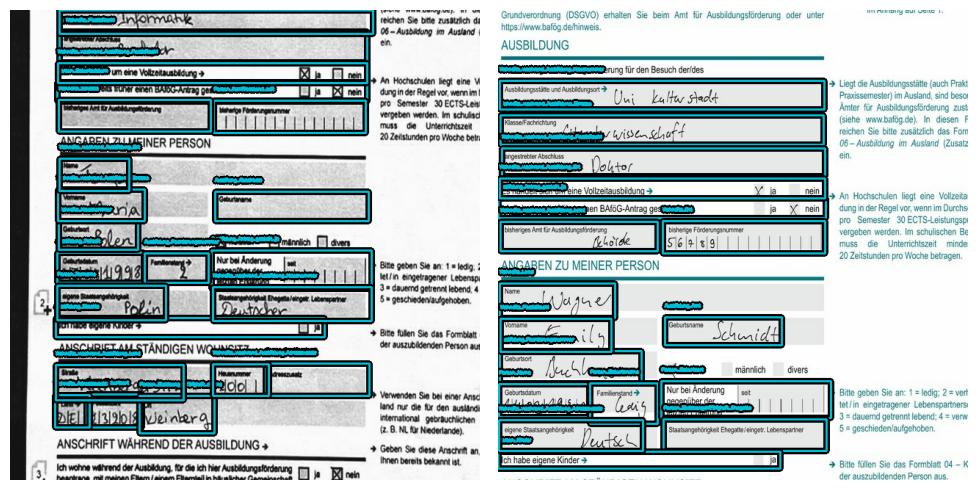

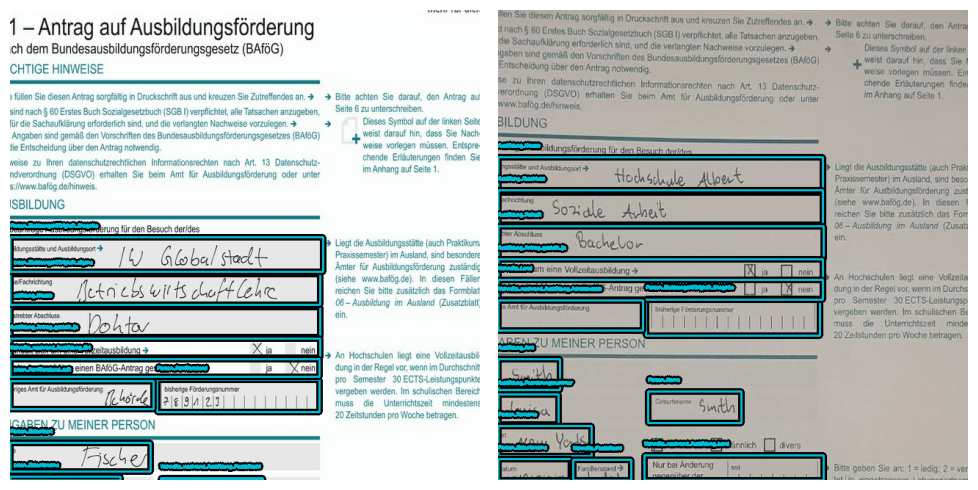

In [36]:
visualize_dataset(sub_train_ds_all, bounding_box_format="xyxy", value_range=(0, 255), rows=1, cols=2)
visualize_dataset(sub_val_ds_all, bounding_box_format="xyxy", value_range=(0, 255), rows=1, cols=2)

In [36]:
def dict_to_tuple(inputs):
    return inputs["images"], inputs["bounding_boxes"]

def create_train_val_tuple(train_ds,val_ds):
    train_ds = train_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
    train_ds = train_ds.prefetch(tf.data.AUTOTUNE)
    val_ds = val_ds.map(dict_to_tuple, num_parallel_calls=tf.data.AUTOTUNE)
    val_ds = val_ds.prefetch(tf.data.AUTOTUNE)
    return train_ds, val_ds


In [37]:
sub_train_ds_all,sub_val_ds_all=create_train_val_tuple(sub_train_ds_all,sub_val_ds_all)
main_train_ds_all,main_val_ds_all=create_train_val_tuple(main_train_ds_all,main_val_ds_all)


In [38]:
print(main_val_ds_all)

<_PrefetchDataset element_spec=(TensorSpec(shape=(2, 640, 640, 3), dtype=tf.float32, name=None), {'classes': RaggedTensorSpec(TensorShape([2, None, None]), tf.float32, 2, tf.int64), 'boxes': RaggedTensorSpec(TensorShape([2, None, None]), tf.float32, 2, tf.int64)})>


### SSD Model

ssd backbone kann Restnet, mobilenet, vgg, oder sogar retina usw

In [39]:
def define_backbone():
    backbone =  keras_cv.models.MobileNetV3Backbone.from_preset(
                "mobilenet_v3_large_imagenet",

    )
    return backbone

Parameter des Models definiert die Anzahl der Boxen und deren Größe. die kleinere aspect_ratios und scales definiert die kleine Boxen während die größere Werte definieren die größere Boxen

In [40]:
aspect_ratios = [1.0, 2.0, 3.0, 4.0, 5.0]  
scales = [0.1, 0.2, 0.3, 0.5, 0.7, 1.0, 1.5, 2.0]  
backbone = define_backbone()

Hilft zum Strukturiren der Daten für das Model training

In [41]:
def preprocess_dataset(images, bounding_boxes):
    # Convert 'images' to a dense tensor
    images = images

    bounding_boxes['classes'] = bounding_boxes['classes']
    bounding_boxes['boxes'] = bounding_boxes['boxes']

    # Create a dictionary with input and target values
    inputs = {'input_layer': images}
    targets = {'boxes': bounding_boxes['boxes'], 'classes': bounding_boxes['classes']}

    return inputs, targets

def prepare_data_for_model(images, bounding_boxes):
    inputs, targets = preprocess_dataset(images, bounding_boxes)

    # Convert Ragged Tensor to dense tensor
    #inputs['input_layer'] = tf.RaggedTensor.to_tensor(inputs['input_layer'])
    targets['boxes'] = tf.RaggedTensor.to_tensor(targets['boxes'])
    targets['classes'] = tf.RaggedTensor.to_tensor(targets['classes'])
    
    return inputs, targets

# Create the dataset with prepared data
main_train_ds_kopie = main_train_ds_all.map(prepare_data_for_model)
main_val_ds_kopie = main_val_ds_all.map(prepare_data_for_model)
sub_train_ds_all_kopie =  sub_train_ds_all.map(prepare_data_for_model)
sub_val_ds_all_kopie = sub_val_ds_all.map(prepare_data_for_model)

In [44]:
dataset = sub_train_ds_all_kopie

# Assuming sub_val_data_2_kopie is your TensorFlow dataset
for batch in dataset:
    input_shape = batch[0]['input_layer'].shape
    boxes_shape = batch[1]['boxes'].shape
    classes_shape = batch[1]['classes'].shape

    print(f"Input shape: {input_shape}, Boxes shape: {boxes_shape}, Classes shape: {classes_shape}")


Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Input shape: (2, 640, 640, 3), Boxes shape: (2, 29, 4), Classes shape: (2, 29, 29)
Inpu

Model an sich kann ohne die NMSAndReshapeLayer layer class existieren, sie hilft aber dazu, dass man nur die beste Boxen der ungefahr 8400 predizierte Boxen auswählt. dieser Wert ändert sich je nachdem, wie viele Werte in diese Liste steht aspect_ratios = [1.0, 2.0, 3.0, 4.0, 5.0]  
scales = [0.1, 0.2, 0.3, 0.5, 0.7, 1.0, 1.5, 2.0]  

Die Anzahl der conv2D Layers ist frei einstellbar hilft aber nicht viel bei der Predictions und demzufolge benötigt das Model mehr Zeit zum Training

die Klasse Tensor enthält die Wahrscheinlichkéit der Klassen für jede Box, am Ende wird die Maximale Wahrscheinlichkéit ausgewählt und die dazu gehörige Box kriegt als Label die ensprechende Klasse

In [ ]:
def generate_default_boxes():
    default_boxes = []

    for scale in scales:
        for aspect_ratio in aspect_ratios:
            width = scale * np.sqrt(aspect_ratio)
            height = scale / np.sqrt(aspect_ratio)

            # Create default box and append to the list
            default_boxes.append([width, height])

    return np.array(default_boxes)

# Example usage
default_boxes = generate_default_boxes()

num_default_boxes = len(default_boxes)

def define_ssd_model(backbone, num_classes, max_boxes_per_image, aspect_ratios, scales):

    input_layer = layers.Input(shape=backbone.input_shape[1:], name='input_layer')

    #backbone_output = backbone.output
    backbone_output = backbone(input_layer)

    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(backbone_output)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)
    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)

    class_scores = layers.Conv2D(num_default_boxes * num_classes, (3, 3), padding='same', name='class_scores')(x)
    class_scores = layers.Reshape((-1, num_classes), name='classes_reshape')(class_scores)
    class_scores = layers.Activation('sigmoid', name='classes')(class_scores)

    box_coords = layers.Conv2D(num_default_boxes * 4, (3, 3), padding='same', name='box_coords')(x)
    box_coords = layers.Reshape((-1, 4), name='boxes')(box_coords)
    boxes_var= box_coords
    classes_var =class_scores
    nms_layer = NMSAndReshapeLayer(max_boxes_per_image, name='nms_and_reshape')
    selected_boxes_3d, selected_class_scores_3d = nms_layer([box_coords, class_scores])

    SSD_model = keras.Model(inputs=input_layer, outputs={'boxes': selected_boxes_3d, 'classes': selected_class_scores_3d}, name='ssd_model')
    return SSD_model
    
class NMSAndReshapeLayer(layers.Layer):
    def __init__(self, max_output_size=None, iou_threshold=0.1, score_threshold=0.1, **kwargs):
        super(NMSAndReshapeLayer, self).__init__(**kwargs)
        self.max_output_size = max_output_size
        self.iou_threshold = iou_threshold
        self.score_threshold = score_threshold

    def call(self, inputs, max_output_size=None):
        """
        Apply NMS and reshape selected boxes and class scores.

        Args:
            inputs: A tuple (box_coords, class_scores).

        Returns:
            Tuple of selected_boxes_3d and selected_class_scores_3d.
        """
        # inputs should be a tuple (box_coords, class_scores)
        box_coords, class_scores = inputs

        # Ensure the shapes are as expected
        assert len(box_coords.shape) == 3 and len(class_scores.shape) == 3, "Input shapes are not as expected."
        
          # Convert box_coords from [x1, y1, x2, y2]   to [y1, x1, y2, x2] format
        box_coords_for_nms = tf.stack([box_coords[:, :, 1], box_coords[:, :, 0],
                                       box_coords[:, :, 3], box_coords[:, :, 2]], axis=-1)

        max_probs = tf.reduce_max(class_scores, axis=-1, keepdims=True)

        # Apply NMS to select top max_output_size boxes
        selected_indices = tf.image.non_max_suppression(
            tf.reshape(box_coords_for_nms, (-1, 4)),
            tf.reshape(max_probs, (-1,)),
            max_output_size=(2*self.max_output_size),
            iou_threshold=self.iou_threshold,
            score_threshold=self.score_threshold,
        )
        #print("before anything seleceted indices ", selected_indices)
        if len(selected_indices) > (2*self.max_output_size):
            #print(" selected indices bigger than {2*self.max_output_size} ",len(selected_indices))
            sorted_indices = tf.argsort(max_probs, direction='DESCENDING')
            #print("choosen selected indices now are  ",len(selected_indices))
            #print("choosen selected indices now are  ",selected_indices)

                # Sort indices for correct slicing
        selected_indices = tf.sort(selected_indices) # if selected indices is less than 40 pad both classes and boxes output
        #print("self.max_output_size number ",self.max_output_size)

        selected_indices = selected_indices[:(2*self.max_output_size)]

        if len(selected_indices) == (2*self.max_output_size):
            # Proceed with the code when there are 40 elements
            selected_boxes = tf.gather(tf.reshape(box_coords, (-1, 4)), selected_indices)
            selected_class_scores = tf.gather(tf.reshape(class_scores, (-1, class_scores.shape[-1])), selected_indices)
        else:
            # Pad selected boxes and class scores to the desired shape
            #print("length of indices less than than {2*self.max_output_size}  ", len(selected_indices))
        
            # Pad with -1
            paddings = [[0, 2 * self.max_output_size - len(selected_indices)], [0, 0]]
        
            # Pad selected boxes
            selected_boxes = tf.pad(tf.gather(tf.reshape(box_coords, (-1, 4)), selected_indices), paddings, constant_values=-1)
        
            # Pad selected class scores
            selected_class_scores = tf.pad(tf.gather(tf.reshape(class_scores, (-1, class_scores.shape[-1])), selected_indices), paddings, constant_values=-1)
               
        num_images = tf.shape(box_coords)[0]
        selected_boxes_3d = tf.reshape(selected_boxes, (num_images, self.max_output_size, 4))
        selected_class_scores_3d = tf.reshape(selected_class_scores, (num_images, self.max_output_size, class_scores.shape[-1]))

        return selected_boxes_3d, selected_class_scores_3d


In [47]:
SSD_model_main = define_ssd_model(backbone, len(main_class_mapping),len(main_class_mapping), aspect_ratios, scales)
SSD_model_main.summary()

Model: "ssd_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_layer (InputLayer)    [(None, None, None, 3)]      0         []                            
                                                                                                  
 mobile_net_v3_backbone (Mo  (None, None, None, 960)      2996352   ['input_layer[0][0]']         
 bileNetV3Backbone)                                                                               
                                                                                                  
 conv2d_16 (Conv2D)          (None, None, None, 256)      2212096   ['mobile_net_v3_backbone[0][0]
                                                                    ']                            
                                                                                          

In [48]:
SSD_model_sub = define_ssd_model(backbone, len(sub_class_mapping),len(sub_class_mapping), aspect_ratios, scales)
SSD_model_sub.summary()
#num_classes = len(main_class_mapping)  # 29
#max_boxes_per_image = len(main_class_mapping) #29

Model: "ssd_model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_layer (InputLayer)    [(None, None, None, 3)]      0         []                            
                                                                                                  
 mobile_net_v3_backbone (Mo  (None, None, None, 960)      2996352   ['input_layer[0][0]']         
 bileNetV3Backbone)                                                                               
                                                                                                  
 conv2d_20 (Conv2D)          (None, None, None, 256)      2212096   ['mobile_net_v3_backbone[1][0]
                                                                    ']                            
                                                                                          

CustomHuberLoss -> ist für die Box loss 
CustomCategoricalCrossEntropy -> ist für die Klasse loss

In [49]:
from keras.losses import binary_crossentropy
from keras.losses import Loss

class CustomHuberLoss(tf.keras.losses.Loss):
    def __init__(self, delta=0.01):
        super(CustomHuberLoss, self).__init__()
        self.huber_loss = tf.keras.losses.Huber(delta=delta)

    def call(self, y_true, y_pred):
        # Convert ragged tensors to dense tensors
        if isinstance(y_true, tf.RaggedTensor):
            y_true = y_true.to_tensor()
        if isinstance(y_pred, tf.RaggedTensor):
            y_pred = y_pred.to_tensor()

        # Ensure both y_true and y_pred are dense tensors
        y_true = tf.convert_to_tensor(y_true)
        y_pred = tf.convert_to_tensor(y_pred)

        # Create a mask for each sample in the batch based on the actual shape of y_true
        mask = tf.math.logical_not(tf.math.equal(tf.reduce_sum(y_true, axis=-1), 0))
        mask = tf.cast(mask, dtype=tf.float32)

        # Use Huber loss
        loss = self.huber_loss(y_true, y_pred)
        #print("y_true boxes ",y_true)
        #print("y_pred boxes ",y_pred)
        loss *= mask
        #print("boxes loss",loss)

        return loss




class CustomCategoricalCrossEntropy(tf.keras.losses.Loss):
    def __init__(self, **kwargs):
        super(CustomCategoricalCrossEntropy, self).__init__(**kwargs)
        self.categorical_crossentropy = tf.keras.losses.CategoricalCrossentropy(reduction=tf.keras.losses.Reduction.NONE)

    def call(self, y_true, y_pred):
        #tf.print("y_true classes:", y_true.shape)
        #tf.print("y_pred classes:", y_pred.shape)

        # Create a mask for each sample in the batch based on the actual shape of y_true
        mask = tf.math.logical_not(tf.math.equal(tf.reduce_sum(y_true, axis=-1), 0))
        mask = tf.reduce_sum(tf.cast(tf.math.logical_and(tf.math.logical_not(tf.math.equal(y_true, 0)), y_true != -1), dtype=tf.float32), axis=-1)
        #print("mask.....",mask.shape)
        # Calculate categorical cross-entropy loss
        loss = self.categorical_crossentropy(y_true, y_pred)

        # Apply the mask to the loss
        loss *= mask

        # Calculate the mean loss, ignoring padded values
        mean_loss = tf.reduce_sum(loss) / tf.reduce_sum(mask)
        #print("y_true classes ",y_true)
        #print("y_pred classes ",y_pred)
        #print ("class_loss...",mean_loss)
        return mean_loss


In [50]:
def define_optimizer():
    optimizer = tf.keras.optimizers.Adam(
        learning_rate=LEARNING_RATE,
        #global_clipnorm=GLOBAL_CLIPNORM, #This ensures that gradients, which influence the model’s parameter updates, 
                                        # don’t become exceedingly large and destabilize training.
    )
    return optimizer

In [51]:
def compile_model(model):

    model.compile(
        optimizer=define_optimizer(),
        loss={
            'boxes': CustomHuberLoss(delta=0.01),
            'classes': CustomCategoricalCrossEntropy()
        },
        loss_weights={'boxes': 1.0, 'classes': 1.0},
        metrics={
            'boxes': ['accuracy'],
            'classes': ['accuracy']
        }
    )
    model.run_eagerly = True


In [52]:
compile_model(SSD_model_sub)
compile_model(SSD_model_main)


In [53]:
def fit_model(model, train_data, validation_data, initial_epoch, checkpoint_path):
    early_stopping = EarlyStopping(monitor='loss',  
                               patience=200,          
                               restore_best_weights=True)  

    checkpoint_path = checkpoint_path
    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_path,
        save_weights_only=True,
        save_best_only=False,
        monitor='loss',  # You can use any metric you are interested in
        mode='auto',
        verbose=1,
    )

    history = model.fit(
        train_data,
        validation_data=validation_data,
        epochs=EPOCH,
        initial_epoch=initial_epoch,  # Specify the epoch from which you want to resume training
        callbacks=[early_stopping, checkpoint_callback]
    )
    
     
    return history
     

#### training all sub boxes

In [55]:
history_ssd_sub = fit_model(SSD_model_sub, sub_train_ds_all_kopie, 
                            sub_val_ds_all_kopie, initial_epoch=0,
                            checkpoint_path=MODEL_PATH + "/ssd_model_sub_checkpoint.h5")


Epoch 1/50

32/32 [==============================] - ETA: 0s - loss: 9.0592 - nms_and_reshape_loss: 5.6777 - nms_and_reshape_1_loss: 3.3815 - nms_and_reshape_accuracy: 0.2419 - nms_and_reshape_1_accuracy: 0.0318
Epoch 1: saving model to workspace/models\ssd_model_sub_checkpoint.h5
32/32 [==============================] - 103s 3s/step - loss: 9.0592 - nms_and_reshape_loss: 5.6777 - nms_and_reshape_1_loss: 3.3815 - nms_and_reshape_accuracy: 0.2419 - nms_and_reshape_1_accuracy: 0.0318 - val_loss: 9.0359 - val_nms_and_reshape_loss: 5.6668 - val_nms_and_reshape_1_loss: 3.3691 - val_nms_and_reshape_accuracy: 0.1616 - val_nms_and_reshape_1_accuracy: 0.0474
Epoch 2/50
32/32 [==============================] - ETA: 0s - loss: 9.0521 - nms_and_reshape_loss: 5.6799 - nms_and_reshape_1_loss: 3.3722 - nms_and_reshape_accuracy: 0.1568 - nms_and_reshape_1_accuracy: 0.0377
Epoch 2: saving model to workspace/models\ssd_model_sub_checkpoint.h5
32/32 [==============================] - 100s 3s/step - loss:

#### training all main boxes

In [65]:
history_ssd_main = fit_model(SSD_model_main, main_train_ds_kopie, 
                            main_val_ds_kopie, initial_epoch=0,
                            checkpoint_path=MODEL_PATH + "/ssd_model_main_checkpoint.h5")


Epoch 1/50
31/31 [==============================] - ETA: 0s - loss: 7.2031 - nms_and_reshape_loss: 5.7767 - nms_and_reshape_1_loss: 1.4265 - nms_and_reshape_accuracy: 0.0323 - nms_and_reshape_1_accuracy: 0.2903
Epoch 1: saving model to workspace/models\ssd_model_main_checkpoint.h5
31/31 [==============================] - 96s 3s/step - loss: 7.2031 - nms_and_reshape_loss: 5.7767 - nms_and_reshape_1_loss: 1.4265 - nms_and_reshape_accuracy: 0.0323 - nms_and_reshape_1_accuracy: 0.2903 - val_loss: 7.1374 - val_nms_and_reshape_loss: 5.7625 - val_nms_and_reshape_1_loss: 1.3749 - val_nms_and_reshape_accuracy: 0.0000e+00 - val_nms_and_reshape_1_accuracy: 0.4643
Epoch 2/50
31/31 [==============================] - ETA: 0s - loss: 7.0481 - nms_and_reshape_loss: 5.6982 - nms_and_reshape_1_loss: 1.3499 - nms_and_reshape_accuracy: 0.0081 - nms_and_reshape_1_accuracy: 0.2782
Epoch 2: saving model to workspace/models\ssd_model_main_checkpoint.h5
31/31 [==============================] - 94s 3s/step - lo

In [57]:
def plot_metrics(history):
    plt.figure(figsize=(12, 6))
    # Box Loss
    plt.subplot(1, 2, 1)
    plt.plot(history.history['nms_and_reshape_loss'], label='Training Box Loss')
    plt.plot(history.history['val_nms_and_reshape_loss'], label='Validation Box Loss')
    plt.title('Training and Validation Box Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Box Loss')
    plt.legend()

    # Klassen Loss
    plt.subplot(1, 2, 2)
    plt.plot(history.history['nms_and_reshape_1_loss'], label='Training Class Loss')
    plt.plot(history.history['val_nms_and_reshape_1_loss'], label='Validation Class Loss')
    plt.title('Training and Validation Class Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Class Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

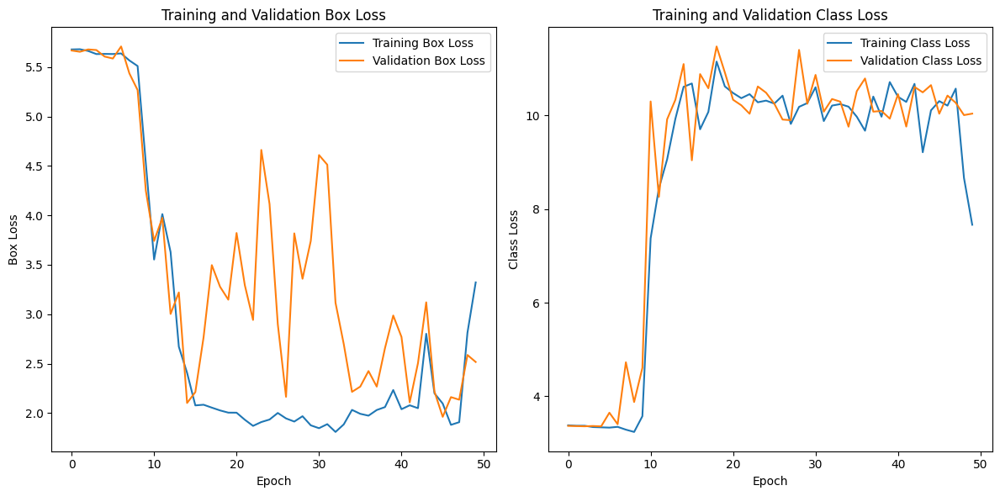

In [58]:
plot_metrics(history_ssd_sub)

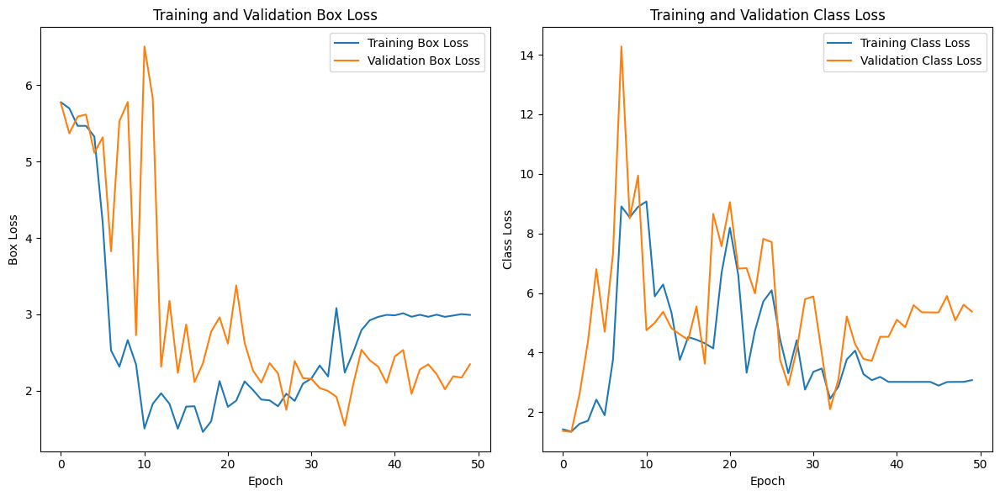

In [67]:
plot_metrics(history_ssd_main)

In [36]:
def visualize_bounding_boxes(image, classes, boxes, class_mapping=None):
    fig, ax = plt.subplots(1)
    ax.imshow(image)

    for class_id, box_set in zip(classes, boxes):
        if class_mapping:
            # Convert class_id to a single-item iterable (list)
            class_id = [class_id]
            # Convert class_id to a tuple
            class_id = tuple(class_id)
            class_name = class_mapping.get(class_id, f"Class {class_id}")
        else:
            class_name = f"Class {class_id}"

        # Check if the box_set is valid (not empty) and iterable
        if box_set and isinstance(box_set[0], (list, np.ndarray)):
            for box in box_set:
                x_min, y_min, x_max, y_max = box
                width = x_max - x_min
                height = y_max - y_min
                rect = patches.Rectangle((x_min, y_min), width, height, linewidth=1, edgecolor='r', facecolor='none')
                ax.add_patch(rect)
                ax.text(x_min, y_min, class_name, color='r', fontsize=8, bbox=dict(facecolor='white', alpha=0.7))
        else:
            # Handle single set of values (floats)
            x_min, y_min, x_max, y_max = box_set
            width = x_max - x_min
            height = y_max - y_min
            rect = patches.Rectangle((x_min, y_min), width, height, linewidth=1, edgecolor='r', facecolor='none')
            ax.add_patch(rect)
            ax.text(x_min, y_min, class_name, color='r', fontsize=8, bbox=dict(facecolor='white', alpha=0.7))

    plt.show()

def predict_on_imagepath_plot(image_path, model):
    image = cv2.imread(image_path)     #target_size=(1344, 768),

    resized_image = cv2.resize(image, (1344, 768))
    batch_images = np.concatenate([resized_image[np.newaxis, ...], resized_image[np.newaxis, ...]], axis=0)

    y_pred = model.predict(batch_images)

    # Extract NumPy arrays from the dictionary
    boxes_np = y_pred['boxes']
    classes_np = y_pred['classes']
    classes_np = classes_np[:, :, 1:]

    valid_indices = np.all(boxes_np != -1, axis=-1)
    boxes_np = boxes_np[valid_indices]
    classes_np = classes_np[valid_indices]
    # Convert one-hot encoded classes to integer labels
    classes_int = np.argmax(classes_np, axis=-1)

    # Proceed with the custom visualization
    visualize_bounding_boxes(
        resized_image,
        classes_int,  # Pass one-hot encoded classes
        boxes_np.tolist(),  # Convert NumPy array to list
        class_mapping=class_mapping
    )



In [ ]:
Visualisierung der Predictions. das Training wurde auf eine  Bildgröße von 640x640 Trainiert.

1/1 [==============================] - 2s 2s/step


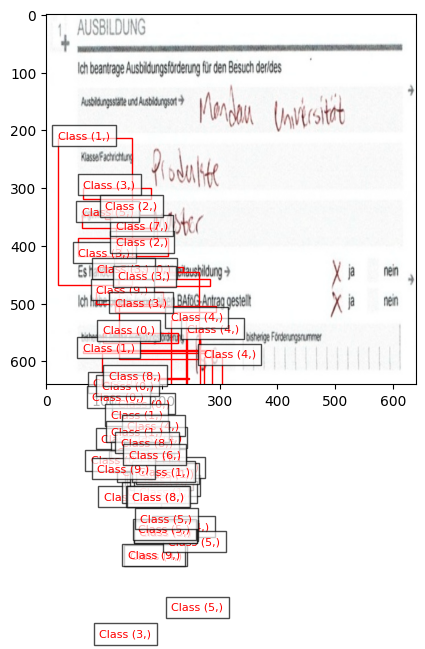

1/1 [==============================] - 2s 2s/step


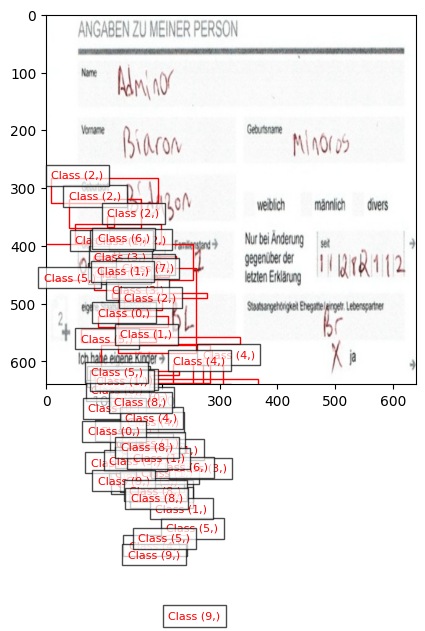

1/1 [==============================] - 2s 2s/step


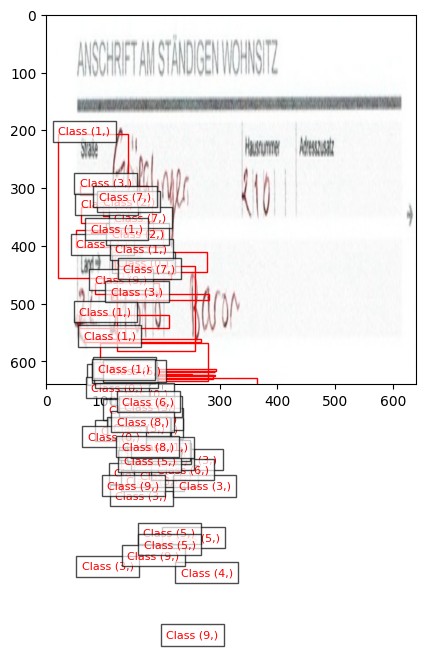

1/1 [==============================] - 2s 2s/step


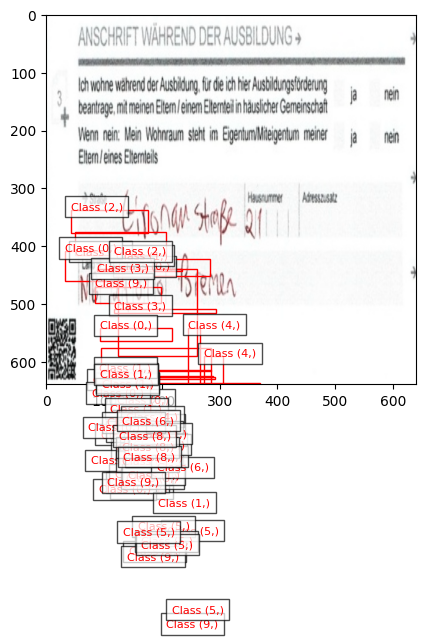

In [76]:
image_path1 = (IMAGE_PATH+ '/640x640_main_classes_scaled/0_9.jpg') 
predict_on_imagepath_plot(image_path1, SSD_model_sub)

image_path1 = (IMAGE_PATH+ '/640x640_main_classes_scaled/1_9.jpg') 
predict_on_imagepath_plot(image_path1, SSD_model_sub)

image_path1 = (IMAGE_PATH+ '/640x640_main_classes_scaled/2_9.jpg') 
predict_on_imagepath_plot(image_path1, SSD_model_sub)

image_path1 = (IMAGE_PATH+ '/640x640_main_classes_scaled/3_9.jpg') 
predict_on_imagepath_plot(image_path1, SSD_model_sub)


In [68]:

def visualize_detections(model, dataset, bounding_box_format, class_mapping):
    images, y_true = next(iter(dataset.take(1)))

    y_pred = model.predict(images)
    
    # Extract NumPy arrays from the dictionary
    boxes_np = y_pred['boxes']
    classes_np = y_pred['classes']
    print(classes_np)
    print(boxes_np)
    # Now boxes has shape (batch_size, num_objects, 4) and classes has shape (batch_size, num_objects, num_classes)
    #print("Boxes prediction ",boxes_np)
    #print("classes prediction",classes_np)

    # Convert one-hot encoded classes to integer labels
    classes_int = np.argmax(classes_np, axis=-1)
    #print(classes_int)
        # Map integer labels using your one_hot_mapping
    #print("classes_int",classes_int)    
  
    images_np = np.array(images)
   
    # Proceed with the visualization
    visualization.plot_bounding_box_gallery(
        images['input_layer'].numpy(),  # Access the images from the dictionary
        value_range=(0, 255),
        bounding_box_format=bounding_box_format,
        y_pred={'classes': classes_int, 'boxes': boxes_np},  # Use integer classes
        scale=5,
        rows=1,
        cols=1,
        show=True,
        font_scale=0.4,
        class_mapping=class_mapping,
    )


1/1 [==============================] - 3s 3s/step
[[[1.0000000e+00 1.0000000e+00 0.0000000e+00 ... 4.4729168e-27
   1.0000000e+00 5.0984315e-15]
  [6.6582756e-19 1.0000000e+00 0.0000000e+00 ... 0.0000000e+00
   1.7000470e-28 0.0000000e+00]
  [0.0000000e+00 1.0000000e+00 0.0000000e+00 ... 1.7673962e-23
   1.0932429e-17 0.0000000e+00]
  ...
  [0.0000000e+00 9.5795054e-27 0.0000000e+00 ... 0.0000000e+00
   1.0000000e+00 0.0000000e+00]
  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
   1.0000000e+00 0.0000000e+00]
  [0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 0.0000000e+00
   1.0000000e+00 0.0000000e+00]]

 [[1.0000000e+00 2.1982487e-05 1.0000000e+00 ... 8.7826085e-26
   0.0000000e+00 0.0000000e+00]
  [1.0000000e+00 1.1708979e-25 1.0000000e+00 ... 0.0000000e+00
   0.0000000e+00 0.0000000e+00]
  [0.0000000e+00 0.0000000e+00 1.1830392e-38 ... 2.0656533e-34
   0.0000000e+00 0.0000000e+00]
  ...
  [0.0000000e+00 4.6382672e-28 2.4030567e-05 ... 0.0000000e+00
   1.2882169e-20 1

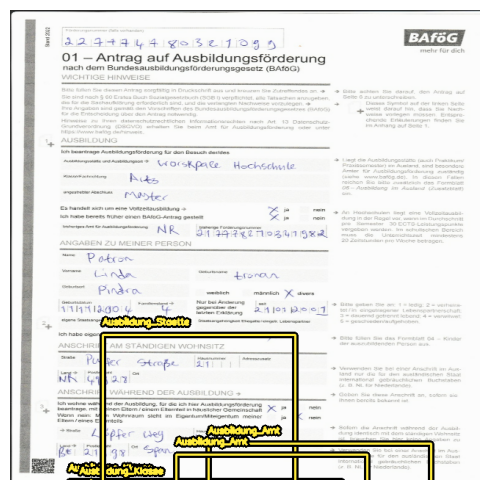

In [73]:
visualize_detections(SSD_model_sub, dataset=sub_val_ds_all_kopie,
                     bounding_box_format="xywh", class_mapping= sub_class_mapping)